## SMART STORE: EMPOWERING FARMERS AND DEPARTMENTAL STORE OWNERS THROUGH AI-DRIVEN RETAIL MANAGEMENT

Smart stores in retail management refer to the integration of advanced technologies and data analytics to enhance the shopping experience, streamline operations, and drive business growth.

## Problem Statement

The problem statement revolves around optimizing inventory management and promoting sales by leveraging machine learning to predict product expiration, recommending dynamic pricing,facilitating farmer sales, and enhancing product quality for departmental stores.Based on market segmentation analysis, the challenge is to enhance inventory management efficiency and boost sales for departmental stores.

## Collecting Data

The dataset consists of order information from a retail store, including details such as Order ID, Customer Name, Category, Sub Category, City, Order Date, Region, Sales, Discount, Profit, and State. 

* Order ID: A unique identifier for each order.
* Customer Name: Name of the customer who placed the order.
* Category: Broad category of the product purchased (e.g., Oil & Masala, Beverages, Food Grains, Fruits & Veggies).
* Sub Category: Specific sub-category of the product (e.g., Masalas, Health Drinks, Atta & Flour, Fresh Vegetables, Organic Staples).
* City: City where the order was placed.
* Order Date: Date when the order was placed.
* Region: Geographic region (e.g., North, South, West) where the order was made.
* Sales: Total sales amount for the order.
* Discount: Discount applied to the order.
* Profit: Profit generated from the order.
* State: State where the order was placed (e.g., Tamil Nadu).

## Exploring Data

In [162]:
## importing the libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from bioinfokit.visuz import cluster


from sklearn.preprocessing import StandardScaler,MinMaxScaler , PowerTransformer , LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans , AgglomerativeClustering
from sklearn.metrics import silhouette_score

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression , LinearRegression
from sklearn.metrics import classification_report,recall_score,precision_score,f1_score,accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import mean_absolute_error , mean_squared_error , r2_score

import warnings
warnings.filterwarnings('ignore')

In [205]:
df = pd.read_csv('Supermart Grocery Sales - Retail Analytics Dataset.csv')
df.head(5)

,Order ID,Customer Name,Category,Sub Category,City,Order Date,Region,Sales,Discount,Profit,State
0,OD1,Harish,Oil & Masala,Masalas,Vellore,11-08-2017,North,1254,0.12,401.28,Tamil Nadu
1,OD2,Sudha,Beverages,Health Drinks,Krishnagiri,11-08-2017,South,749,0.18,149.80,Tamil Nadu
2,OD3,Hussain,Food Grains,Atta & Flour,Perambalur,06-12-2017,West,2360,0.21,165.20,Tamil Nadu
3,OD4,Jackson,Fruits & Veggies,Fresh Vegetables,Dharmapuri,10-11-2016,South,896,0.25,89.60,Tamil Nadu
4,OD5,Ridhesh,Food Grains,Organic Staples,Ooty,10-11-2016,South,2355,0.26,918.45,Tamil Nadu


In [206]:
df.shape ## there are 11 columns and 9994 rows

(9994, 11)

In [207]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Order ID       9994 non-null   object 
 1   Customer Name  9994 non-null   object 
 2   Category       9994 non-null   object 
 3   Sub Category   9994 non-null   object 
 4   City           9994 non-null   object 
 5   Order Date     9994 non-null   object 
 6   Region         9994 non-null   object 
 7   Sales          9994 non-null   int64  
 8   Discount       9994 non-null   float64
 9   Profit         9994 non-null   float64
 10  State          9994 non-null   object 
dtypes: float64(2), int64(1), object(8)
memory usage: 859.0+ KB


In [208]:
df['Order Date'].unique()

array(['11-08-2017', '06-12-2017', '10-11-2016', ..., '3/16/2015',
       '8/29/2016', '04-06-2017'], dtype=object)

In [209]:
## Changing the data type of Order date column

df['Order_Date'] = pd.to_datetime(df['Order Date'], format='%m-%d-%Y', errors='coerce')
df['Order_Date'] = df['Order_Date'].fillna(pd.to_datetime(df['Order Date'], format='%m/%d/%Y', errors='coerce'))
df=df.drop(['Order Date','Order ID'],axis=1)

In [210]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Customer Name  9994 non-null   object        
 1   Category       9994 non-null   object        
 2   Sub Category   9994 non-null   object        
 3   City           9994 non-null   object        
 4   Region         9994 non-null   object        
 5   Sales          9994 non-null   int64         
 6   Discount       9994 non-null   float64       
 7   Profit         9994 non-null   float64       
 8   State          9994 non-null   object        
 9   Order_Date     9994 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(2), int64(1), object(6)
memory usage: 780.9+ KB


In [211]:
df.head(2)

,Customer Name,Category,Sub Category,City,Region,Sales,Discount,Profit,State,Order_Date
0,Harish,Oil & Masala,Masalas,Vellore,North,1254,0.12,401.28,Tamil Nadu,2017-11-08
1,Sudha,Beverages,Health Drinks,Krishnagiri,South,749,0.18,149.80,Tamil Nadu,2017-11-08


## Numerical Columns:

In [212]:
num = df.select_dtypes(np.number).columns.tolist()
num

['Sales', 'Discount', 'Profit']

## Categorical Columns:

In [213]:
cat =  df.select_dtypes(object).columns.tolist()
cat

['Customer Name', 'Category', 'Sub Category', 'City', 'Region', 'State']

## Inference

The dataset contains 11 columns and 9994 rows with the information of a general grocery stores in Tamilnadu in varies districts.

## Descriptive Statistics

Here in this we could see the Common descriptive statistics include measures such as mean, median, mode, standard deviation, variance, range, and percentiles.

In [214]:
df[num].describe()

,Sales,Discount,Profit
count,9994.000000,9994.000000,9994.000000
mean,1496.596158,0.226817,374.937082
std,577.559036,0.074636,239.932881
min,500.000000,0.100000,25.250000
25%,1000.000000,0.160000,180.022500
50%,1498.000000,0.230000,320.780000
75%,1994.750000,0.290000,525.627500
max,2500.000000,0.350000,1120.950000


In [215]:
df[cat].describe()

,Customer Name,Category,Sub Category,City,Region,State
count,9994,9994,9994,9994,9994,9994
unique,50,7,23,24,5,1
top,Amrish,Snacks,Health Drinks,Kanyakumari,West,Tamil Nadu
freq,227,1514,719,459,3203,9994


## Univariant Analysis

## Numeric

In [216]:
df[num].skew()

Sales       0.000927
Discount   -0.026487
Profit      0.767397
dtype: float64

Sales has almost no skewness, while Discount is slightly left-skewed (more lower discounts), and Profit is right-skewed (more higher profits).

In [217]:
df[num].kurt()

Sales      -1.188343
Discount   -1.176112
Profit     -0.181367
dtype: float64

## visualize the distribution of all the numerical columns

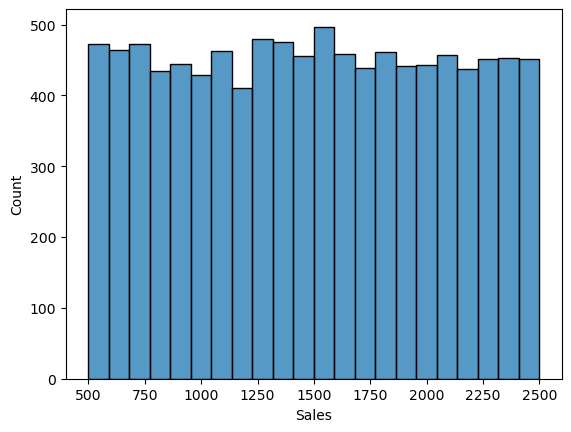

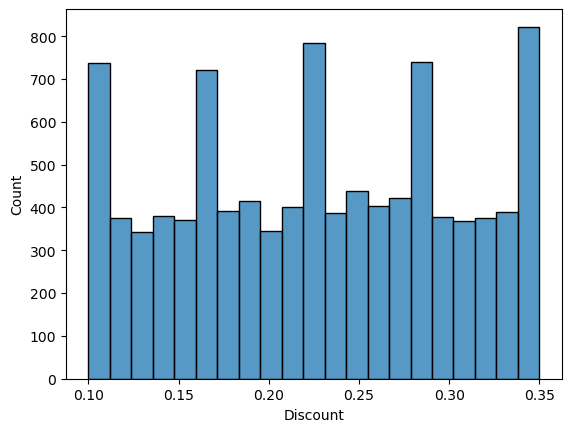

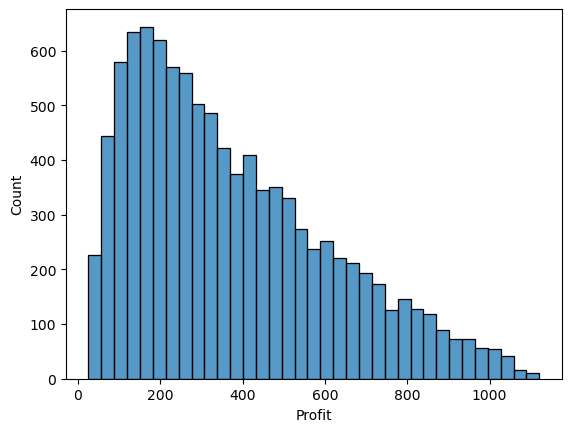

In [218]:
for i in num:
    sns.histplot(df[i])
    plt.show()    

## Outliers

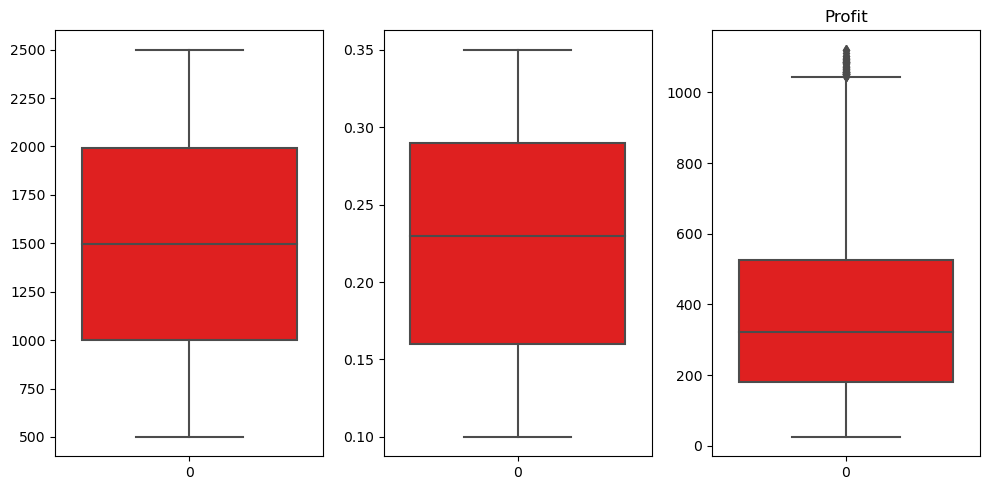

In [219]:
fig,ax=plt.subplots(1,3 , figsize=(10,5))

for i , subplot in zip(df[num] , ax.flatten()):
    sns.boxplot(df[i] , ax=subplot , color='red')
    plt.title(i)
plt.tight_layout()
plt.show()

Outliers are present in Profit column but we are not going to treat it .

## Categorical

In [220]:
cat

['Customer Name', 'Category', 'Sub Category', 'City', 'Region', 'State']

In [221]:
for i in cat:
    print(i , df[i].nunique())

Customer Name 50
Category 7
Sub Category 23
City 24
Region 5
State 1


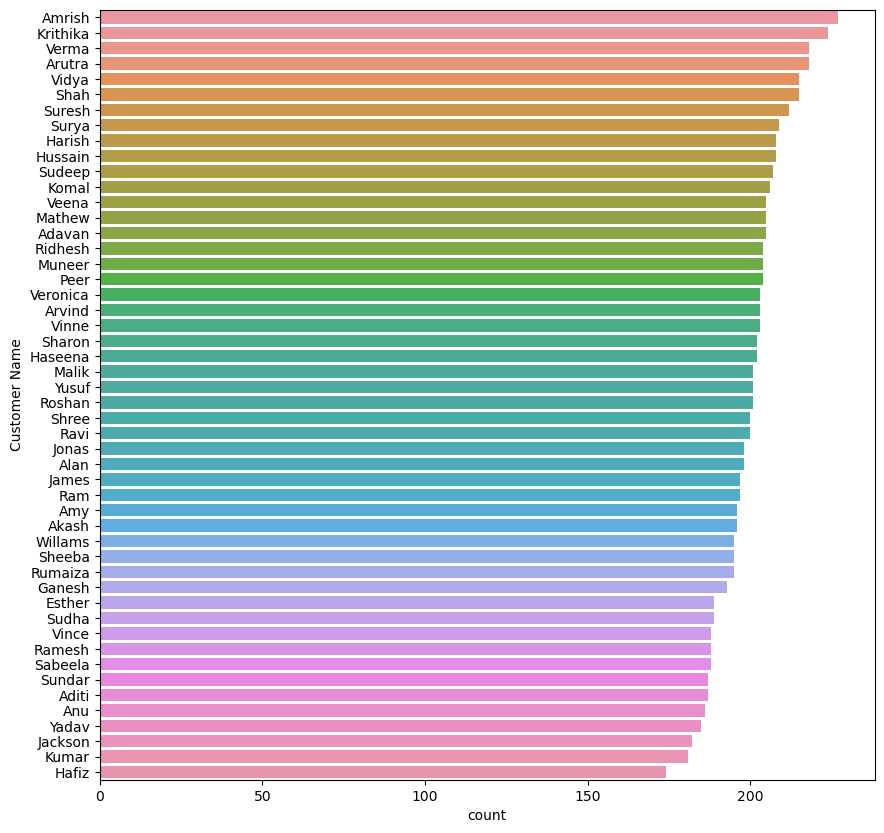

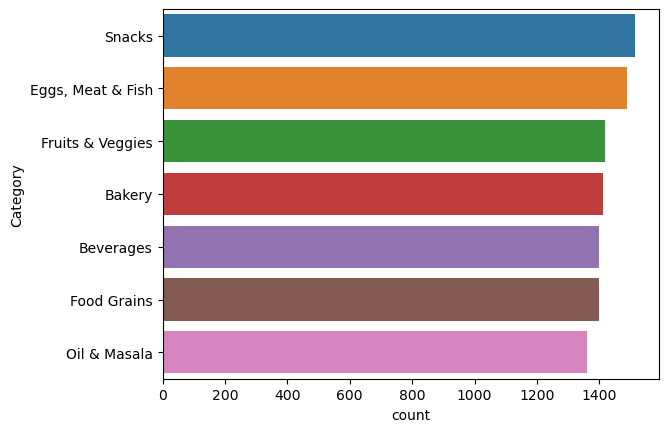

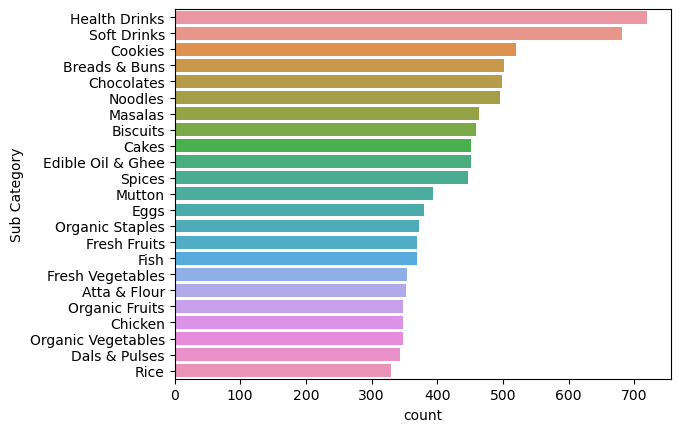

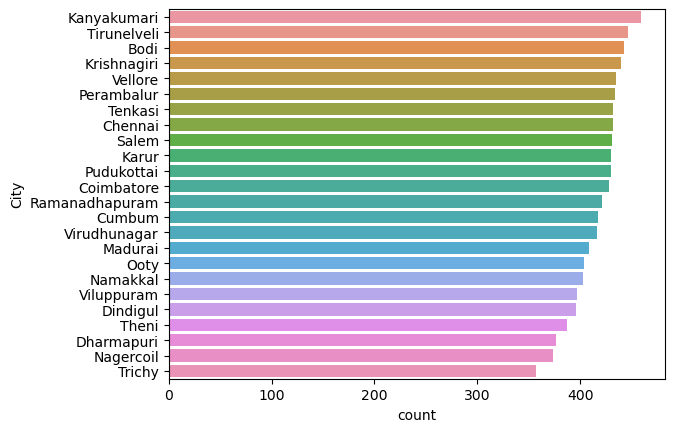

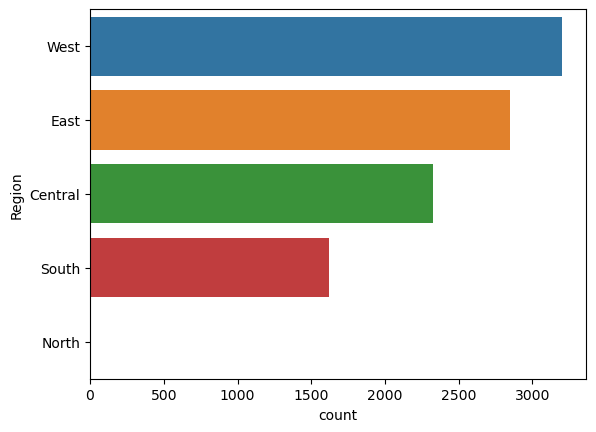

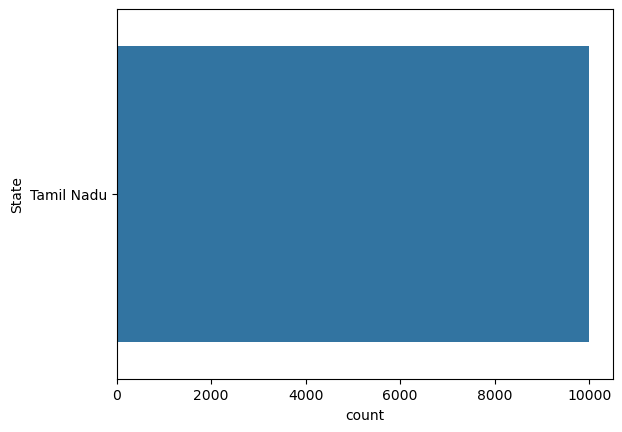

In [222]:
plt.figure(figsize=(10,10))
for i in cat:
    sns.countplot(y= df[i] , order=df[i].value_counts().index)
    plt.show()

## Inference

* Amrish is the top buyer through out these 4 years in the retail smart store.
* Snacks and Eggs, meat & Fish are the top selling product category in the smart store.
* Health Drinks and Soft Drinks are the top selling sub category products.
* Dal & Pulses and Rice are the least ordered products from the smart store.
* Kanyakumari and Tirunelveli districts have placed the more orders through this retail shop.
* West of Tamil Nadu are the top buyers in the smart store.

In [223]:
## Checking Null values

In [224]:
df.isnull().sum()

Customer Name    0
Category         0
Sub Category     0
City             0
Region           0
Sales            0
Discount         0
Profit           0
State            0
Order_Date       0
dtype: int64

In [225]:
duplicate_rows= df.duplicated()
tot_duplicate_rows= duplicate_rows.sum()
duplicate_data = df[duplicate_rows]
print("Duplicate rows:")
print(duplicate_data)

Duplicate rows:
Empty DataFrame
Columns: [Customer Name, Category, Sub Category, City, Region, Sales, Discount, Profit, State, Order_Date]
Index: []


## Inference

There is no null values and no duplicates present

## Bivariant Analysis

In [226]:
df.head(2)

,Customer Name,Category,Sub Category,City,Region,Sales,Discount,Profit,State,Order_Date
0,Harish,Oil & Masala,Masalas,Vellore,North,1254,0.12,401.28,Tamil Nadu,2017-11-08
1,Sudha,Beverages,Health Drinks,Krishnagiri,South,749,0.18,149.80,Tamil Nadu,2017-11-08


## City vs Profit

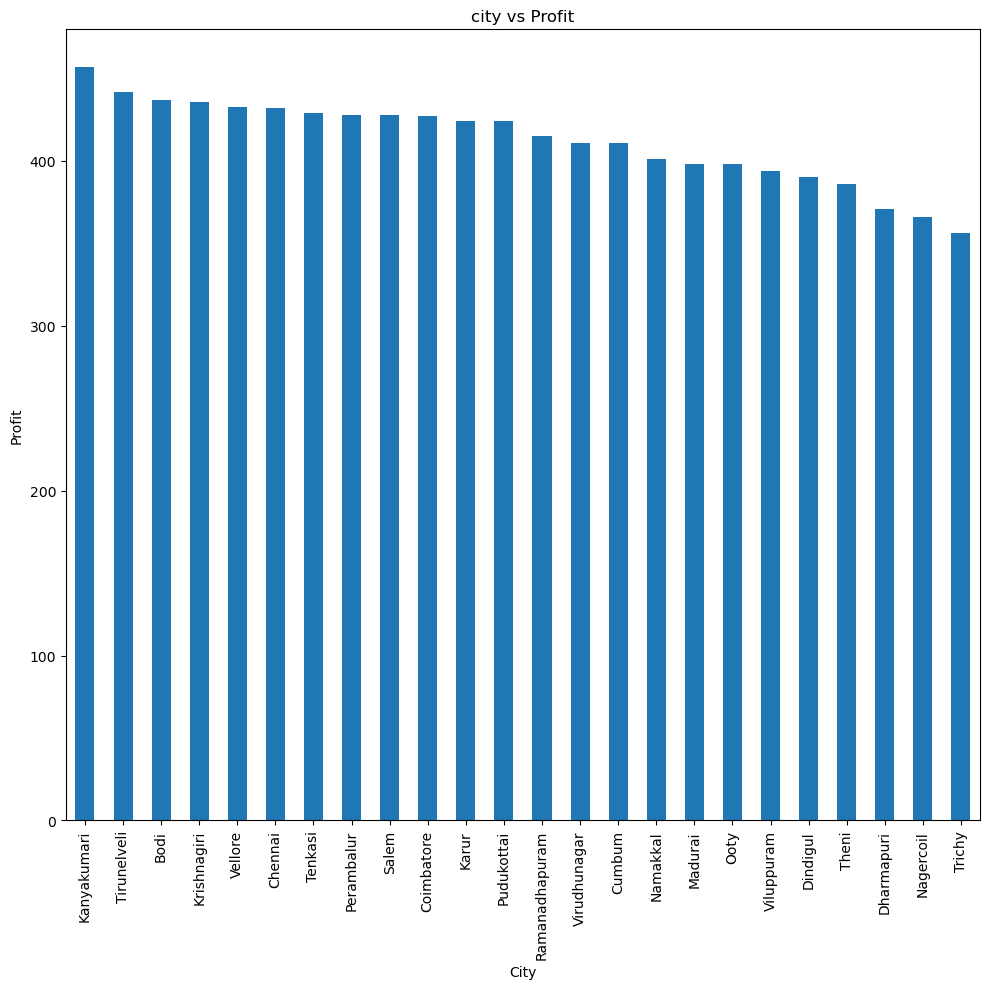

In [227]:
city_profit_count= df.groupby('City')['Profit'].nunique()
city_profit_count_sorted = city_profit_count.sort_values(ascending=False)
plt.figure(figsize=(10,10))
city_profit_count_sorted.plot(kind='bar')
plt.xlabel('City')
plt.ylabel('Profit')
plt.title('city vs Profit')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## Inference

* Smart store turnover is mainly contributed by the districts of Kanyakumari , Tirunelveli. Least is contributed by Trichy.

## Category Vs Sales

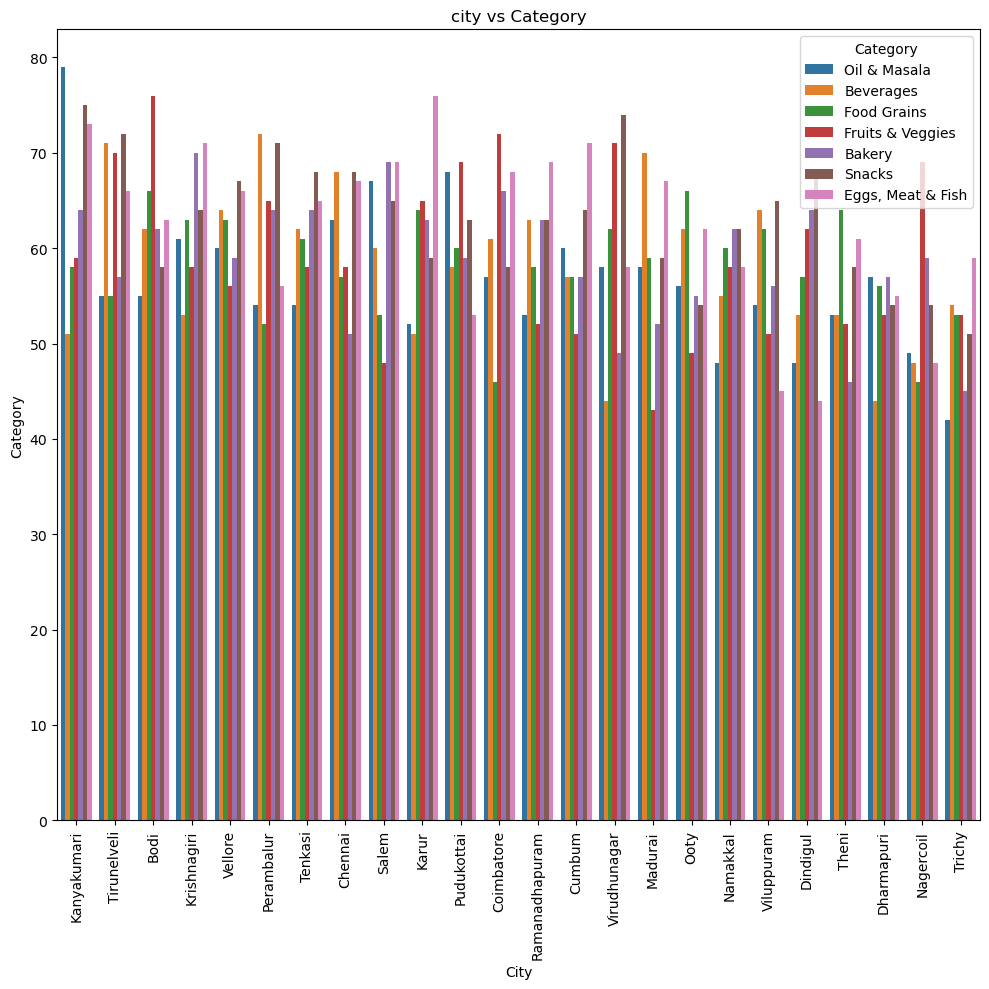

In [228]:
plt.figure(figsize=(10,10))
##sns.countplot(data=df,x='City',hue='Category')
sns.countplot(data=df, x='City', hue='Category', order=df['City'].value_counts().index)
plt.xlabel('City')
plt.ylabel('Category')
plt.title('city vs Category')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## Inference

* Oil & Masala and Snacks are the top selling products in Kanyakumari , followed by beverages and snacks in Tirunelvali places 
* Oil and Masala are the least selling products in Trichy.

## City Vs Sub category

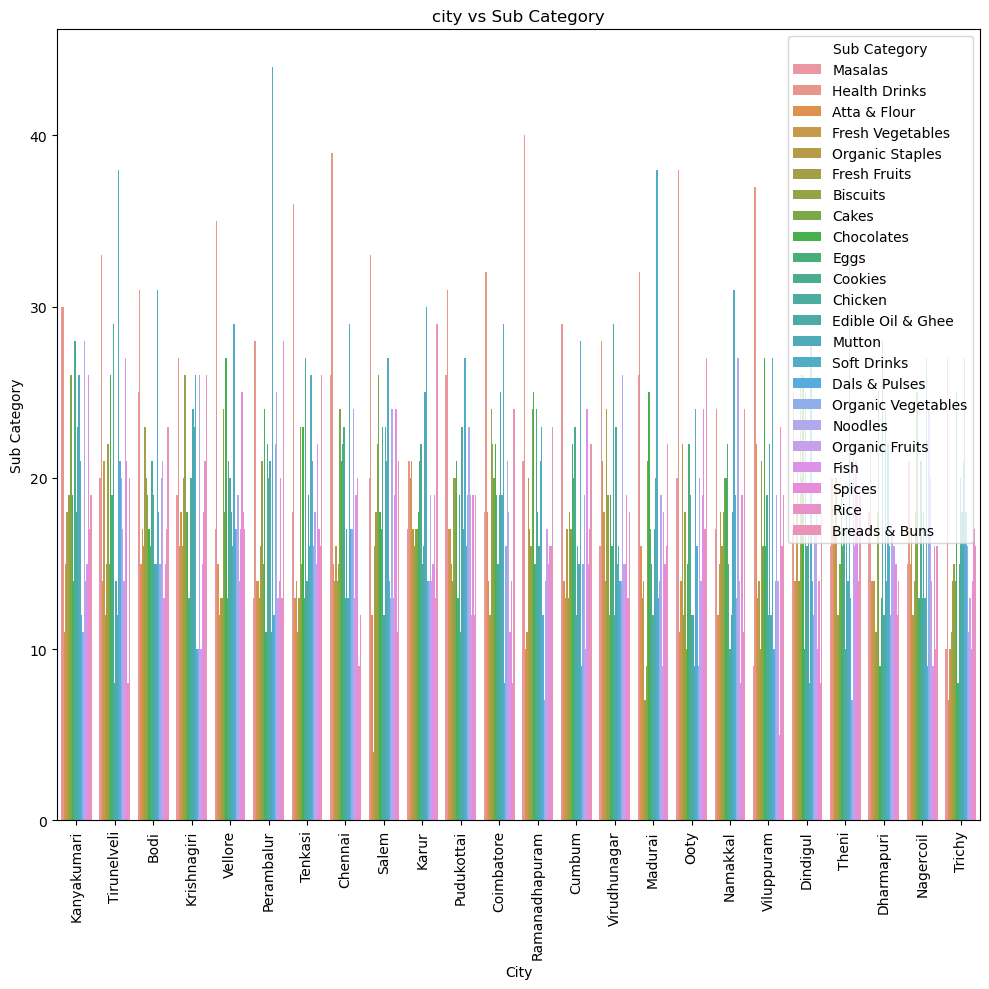

In [229]:
plt.figure(figsize=(10,10))
sns.countplot(data=df, x='City', hue='Sub Category', order=df['City'].value_counts().index)
plt.xlabel('City')
plt.ylabel('Sub Category')
plt.title('city vs Sub Category')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## Year Vs Sales

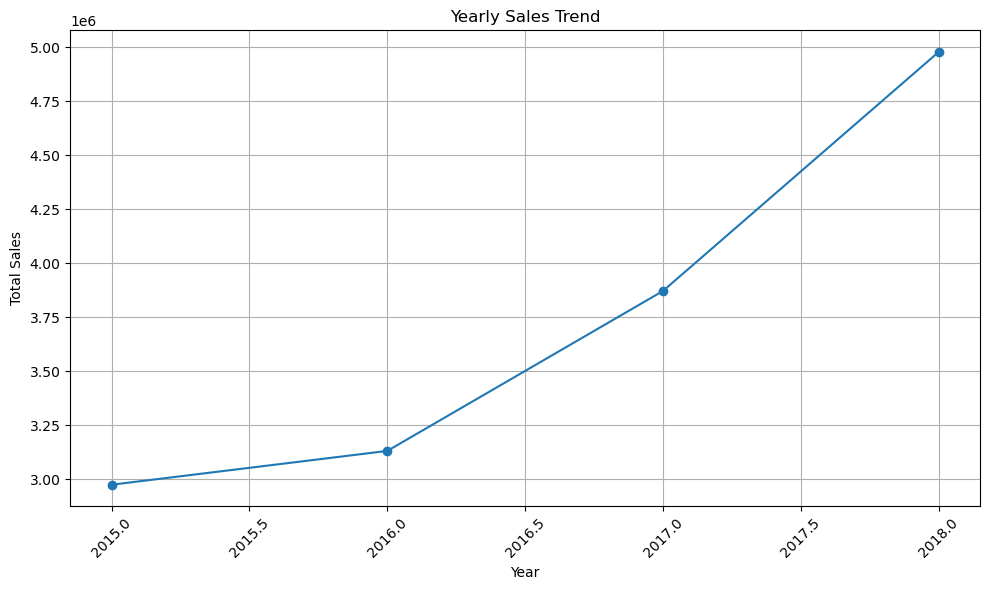

In [230]:
df['Year'] = df['Order_Date'].dt.year

# Group by 'Year' and sum the 'Sales' for each year
yearly_sales = df.groupby('Year')['Sales'].sum()

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(yearly_sales.index, yearly_sales.values, marker='o', linestyle='-')
plt.xlabel('Year')
plt.ylabel('Total Sales')
plt.title('Yearly Sales Trend')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.grid(True)
plt.tight_layout()
plt.show()

In [231]:
## City VS Subcategory

<Figure size 1000x1000 with 0 Axes>

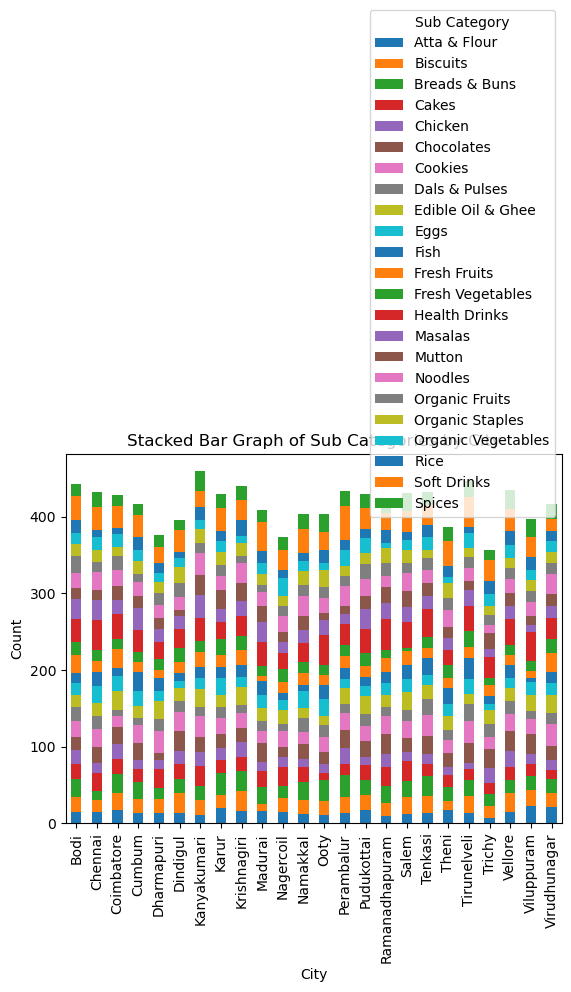

In [232]:
city_subcategory_count = df.groupby(['City', 'Sub Category']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(10, 10))
city_subcategory_count.plot(kind='bar', stacked=True)
plt.xlabel('City')
plt.ylabel('Count')
plt.title('Stacked Bar Graph of Sub Categories by City')
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.legend(title='Sub Category', bbox_to_anchor=(1,2.22), loc='upper right')
plt.tight_layout()
plt.show()

## Inference 

* Chicken , Fish , Noodles and spices has gradualy incresed its selling in all the districts of Tamil nadu.

## Month per Sales

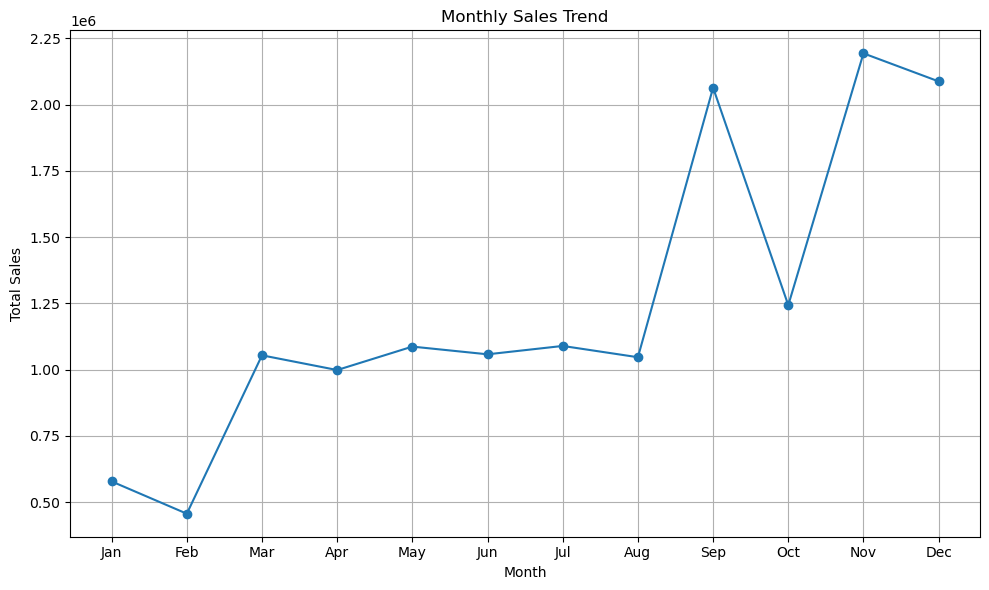

In [233]:
df['Month'] = df['Order_Date'].dt.month
monthly_sales = df.groupby('Month')['Sales'].sum()

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(monthly_sales.index, monthly_sales.values, marker='o', linestyle='-')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.title('Monthly Sales Trend')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.tight_layout()
plt.show()


## Inference

* In the month of March to August the sale of products is constant without incresing because of the Summer people tend to consumer less food. .

## Multi-Variate Analysis

## month wise sales of the product( category)

<Figure size 1000x600 with 0 Axes>

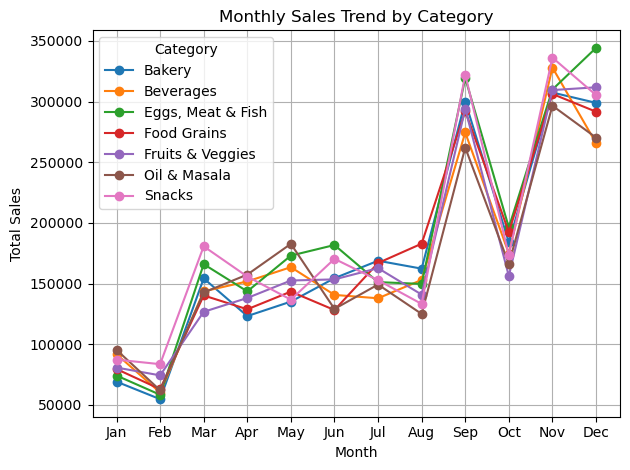

In [234]:
df['Month'] = df['Order_Date'].dt.month

# Group by 'Month' and 'Sub Category' and sum the 'Sales' for each combination
monthly_subcategory_sales = df.groupby(['Month', 'Category'])['Sales'].sum().unstack()

# Plotting
plt.figure(figsize=(10, 6))
monthly_subcategory_sales.plot(marker='o', linestyle='-')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.title('Monthly Sales Trend by Category')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend(title='Category', loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

## Month wise sales of the sub category

<Figure size 1000x600 with 0 Axes>

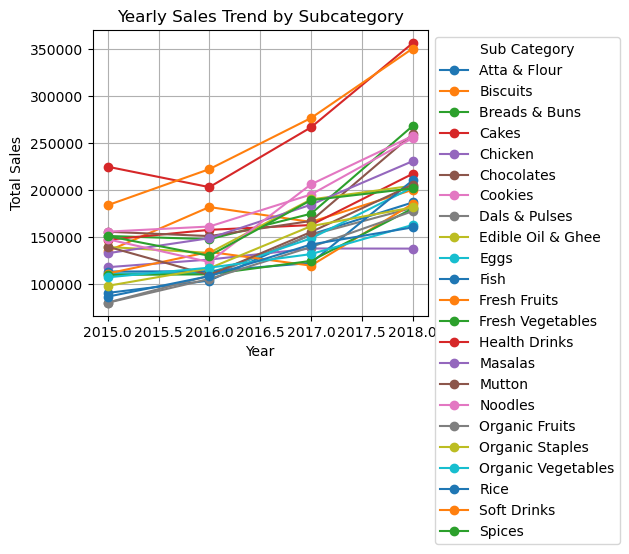

In [235]:
df['Day'] = df['Order_Date'].dt.day

# Group by 'Month' and 'Sub Category' and sum the 'Sales' for each combination
monthly_subcategory_sales = df.groupby(['Year', 'Sub Category'])['Sales'].sum().unstack()

# Plotting
plt.figure(figsize=(10, 6))
monthly_subcategory_sales.plot(marker='o', linestyle='-')
plt.xlabel('Year')
plt.ylabel('Total Sales')
plt.title('Yearly Sales Trend by Subcategory')
#plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend(title='Sub Category', bbox_to_anchor=(1, 1) ,loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

## Yearly-Monthly Sales Trend

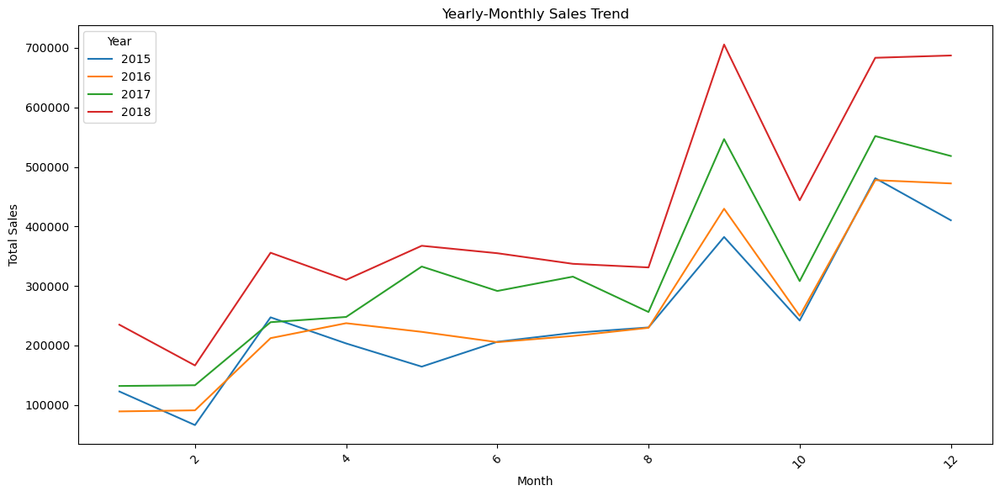

In [236]:
monthly_sales = df.groupby(['Year', 'Month'])['Sales'].sum().reset_index()

# Plotting the trend graph
plt.figure(figsize=(12, 6))
for year in monthly_sales['Year'].unique():
    year_data = monthly_sales[monthly_sales['Year'] == year]
    plt.plot(year_data['Month'], year_data['Sales'], label=year)

plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.title('Yearly-Monthly Sales Trend')
plt.legend(title='Year')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()

## data based on Category

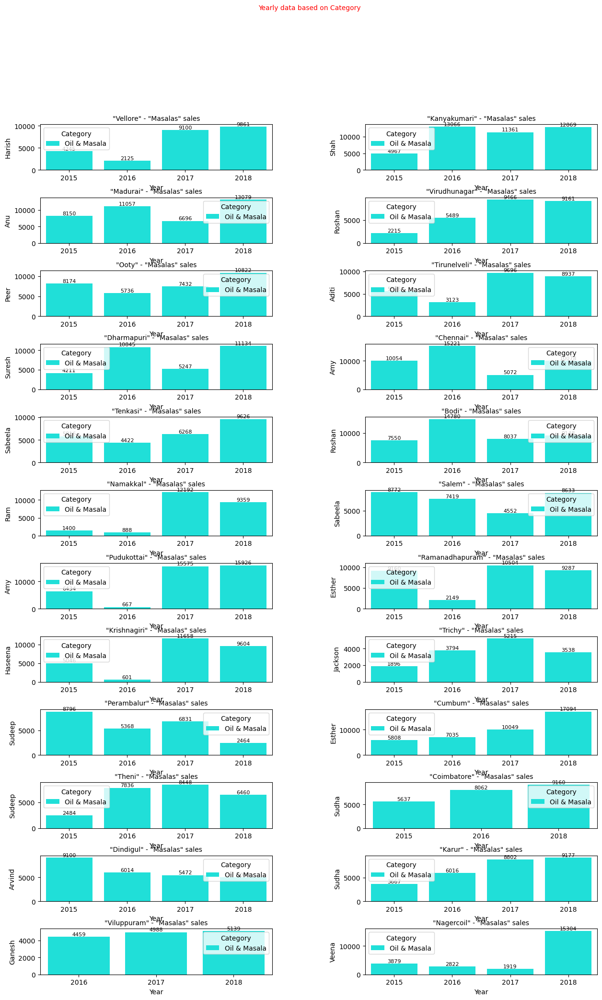

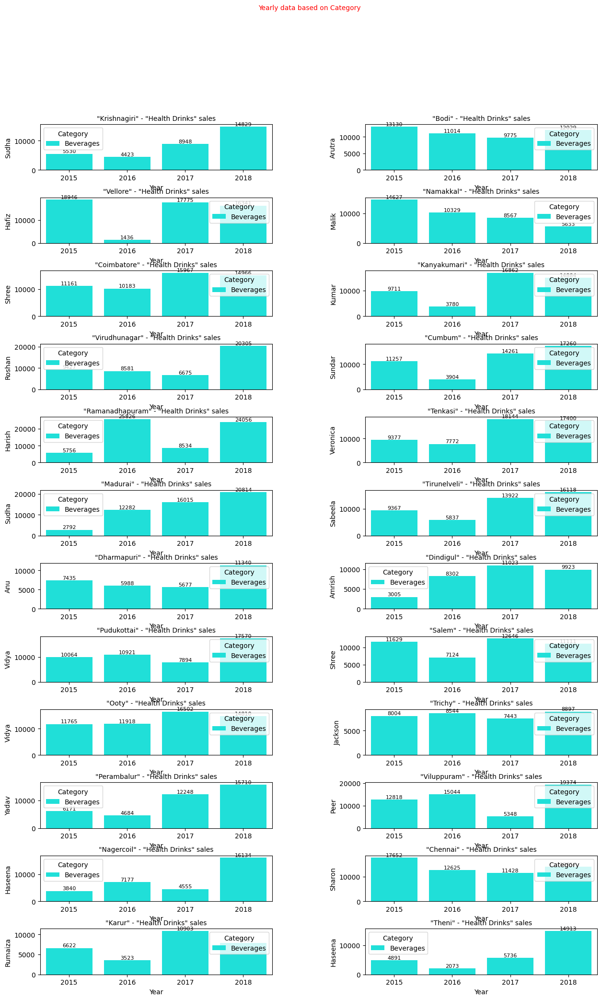

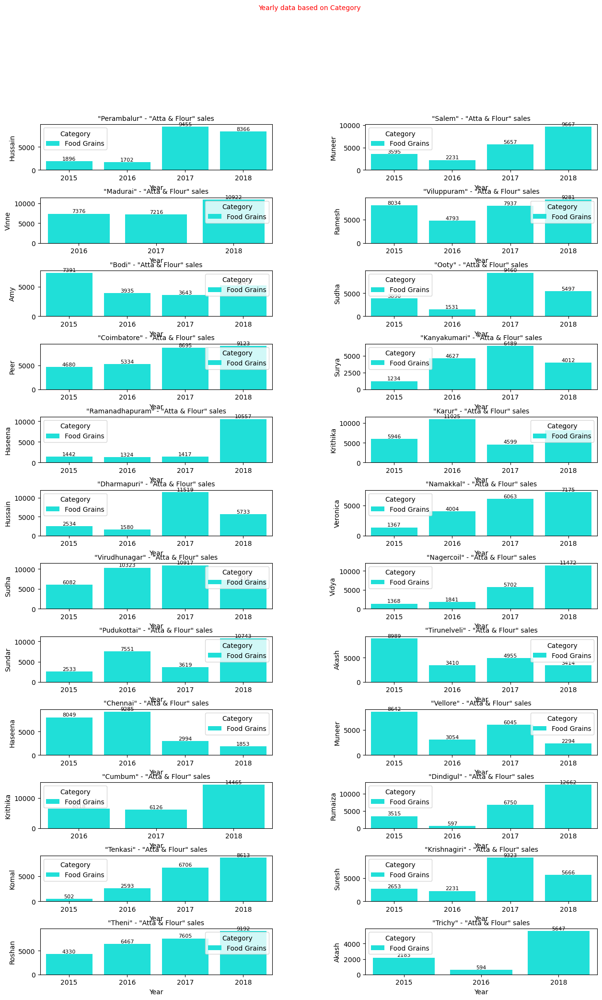

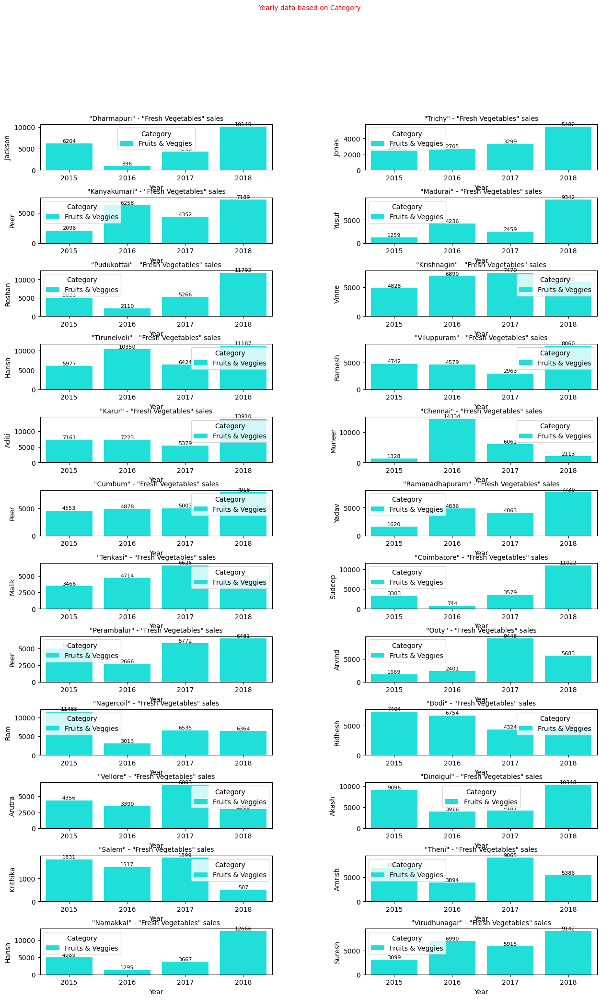

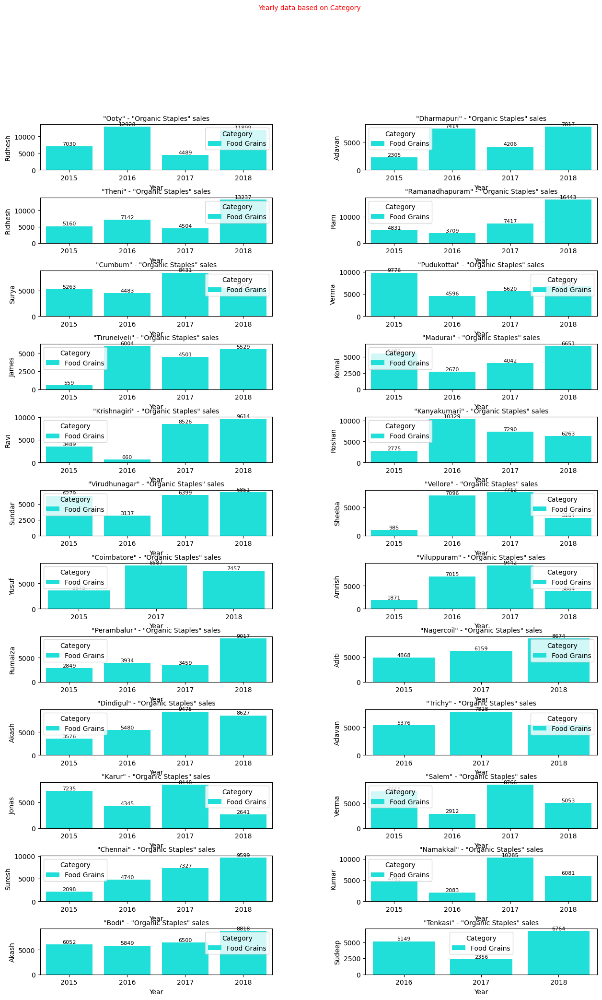

...

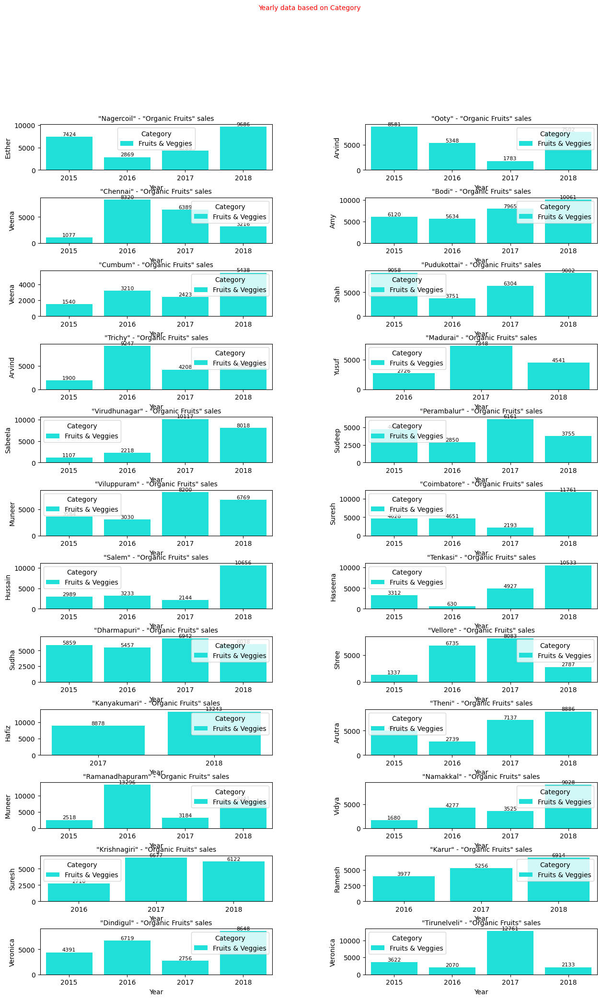

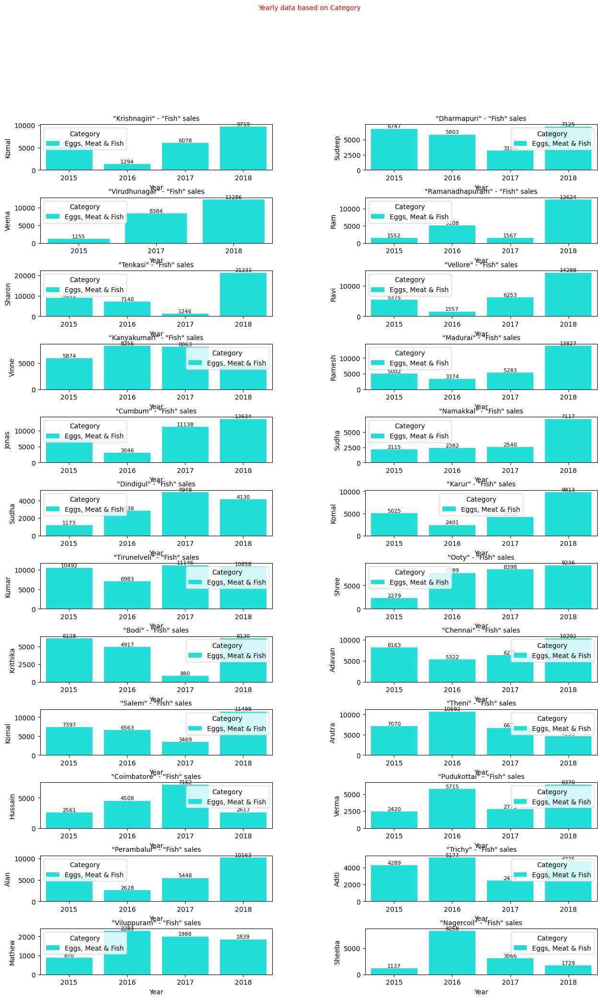

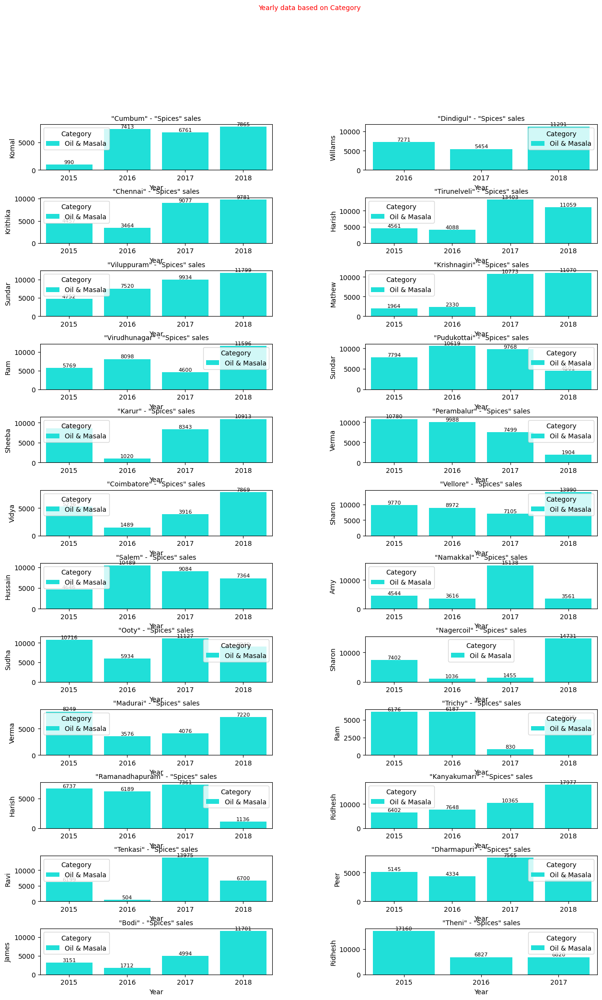

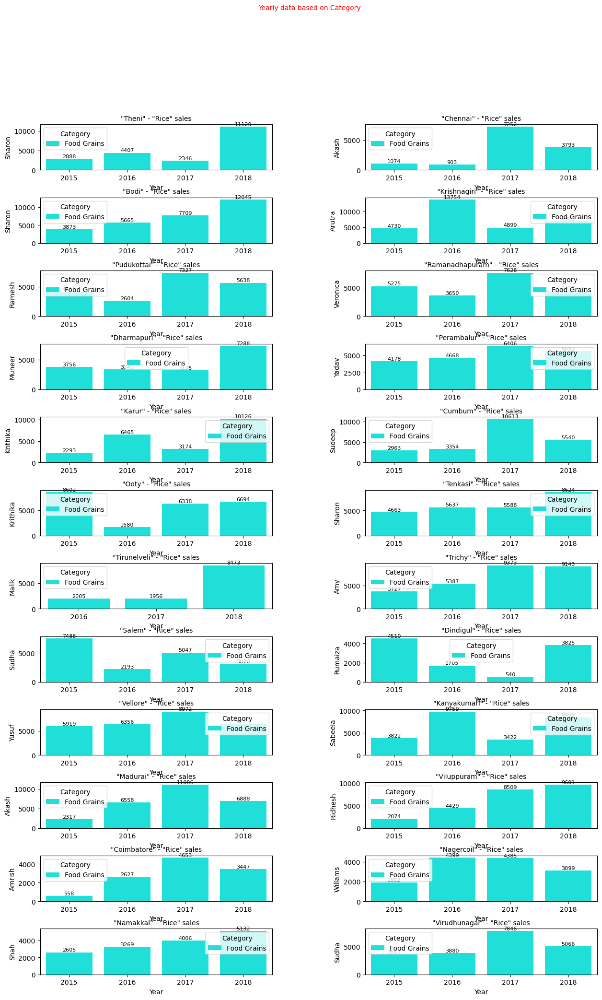

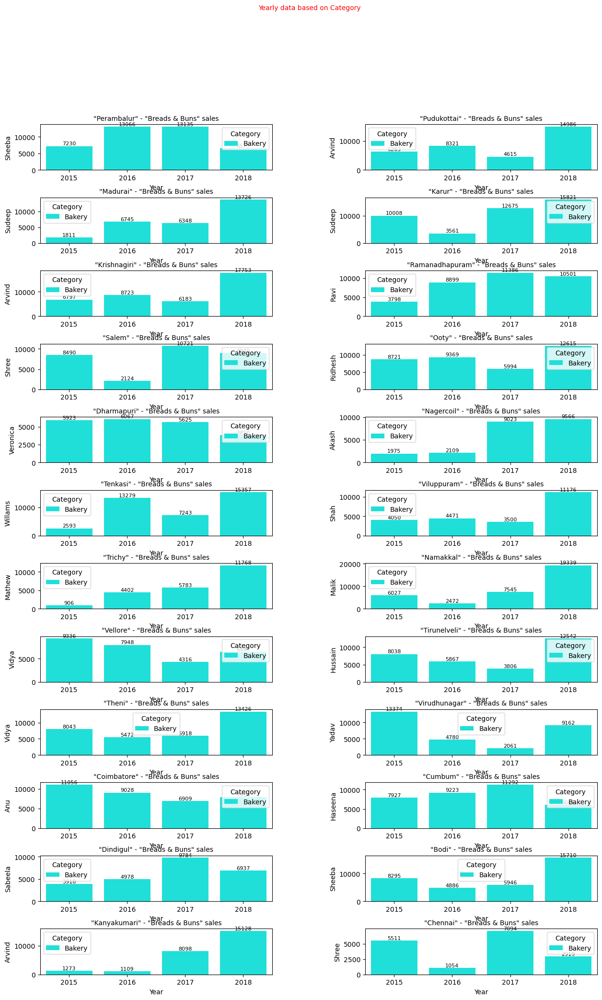

In [136]:
for Sub_Category in df['Sub Category'].unique():
    dt = df[df['Sub Category'] == Sub_Category]
    
    plt.figure(figsize=(15,25))
    
    plt.subplots_adjust(wspace=0.4, hspace=0.6)  # Adjust spacing between subplots
    
    for i, city in enumerate(dt['City'].unique()):
        unit = dt[dt['City'] == city]['Customer Name'].unique()[0]
        
        plt.subplot(int(len(dt['City'].unique()) / 2) + 1, 2, i + 1)
        
        f = sns.barplot(x=dt[dt['City'] == city]['Year'], 
                        y=dt[dt['City'] == city]['Sales'],
                        hue=dt['Category'], estimator=sum, ci=None, palette='hsv')
        f.bar_label(f.containers[0], fontsize=8)  # Adjust font size of bar labels
        plt.xlabel('Year', fontsize=10)  # Adjust font size of x-axis label
        plt.ylabel(f'{unit}', fontsize=10)  # Adjust font size of y-axis label
        plt.title(f'"{city}" - "{Sub_Category}" sales', fontsize=10)  # Adjust font size of title
    
    plt.suptitle(f"Yearly data based on Category", fontsize=10, color='red')  # Adjust font size of suptitle
    plt.show()

## Inference

* Biscuits , Organic vegetables , Dal and Pulses the sales has incresed in the year from 2015 to 2018
* The Sales has always increasing but gradually decreasing in the month of december for all the years.
* Amy from Pudukkottai is the top buyer of Masalas in the year 2018.
* Harish from Ramanadhapuram is the top customer for Health drinks throughout from 2015 to 2018.
* Kartick from Cumbum is the top buyer of Atta and Flour.
* Karur is the top selling of the Fresh Vegetables in the 2018

## Encoding

In [237]:
## categorical_columns = ['Category','Sub Category','City','Region','State']
categorical_columns = ['Category','City']


df_encoded = pd.get_dummies(df, columns=categorical_columns, dtype=int)

In [238]:
label_encoder = LabelEncoder()

# Encode the 'Customer Name' column
df_encoded['Customer Name Encoded'] = label_encoder.fit_transform(df['Customer Name'])

In [239]:
df_encoded.head(2)

,Customer Name,Sub Category,Region,Sales,Discount,Profit,State,Order_Date,Year,Month,...,City_Ramanadhapuram,City_Salem,City_Tenkasi,City_Theni,City_Tirunelveli,City_Trichy,City_Vellore,City_Viluppuram,City_Virudhunagar,Customer Name Encoded
0,Harish,Masalas,North,1254,0.12,401.28,Tamil Nadu,2017-11-08,2017,11,...,0,0,0,0,0,0,1,0,0,12
1,Sudha,Health Drinks,South,749,0.18,149.80,Tamil Nadu,2017-11-08,2017,11,...,0,0,0,0,0,0,0,0,0,37


In [240]:
## Coping the dataset for future
encoded_df_copy = df_encoded.copy()

In [241]:
## df= df.drop('Customer Name',axis=1)

In [242]:
df = df_encoded.drop(['Order_Date','Sub Category','Region','State','Customer Name'],axis=1)

In [243]:
df.head(2)

,Sales,Discount,Profit,Year,Month,Day,Category_Bakery,Category_Beverages,"Category_Eggs, Meat & Fish",Category_Food Grains,...,City_Ramanadhapuram,City_Salem,City_Tenkasi,City_Theni,City_Tirunelveli,City_Trichy,City_Vellore,City_Viluppuram,City_Virudhunagar,Customer Name Encoded
0,1254,0.12,401.28,2017,11,8,0,0,0,0,...,0,0,0,0,0,0,1,0,0,12
1,749,0.18,149.80,2017,11,8,0,1,0,0,...,0,0,0,0,0,0,0,0,0,37


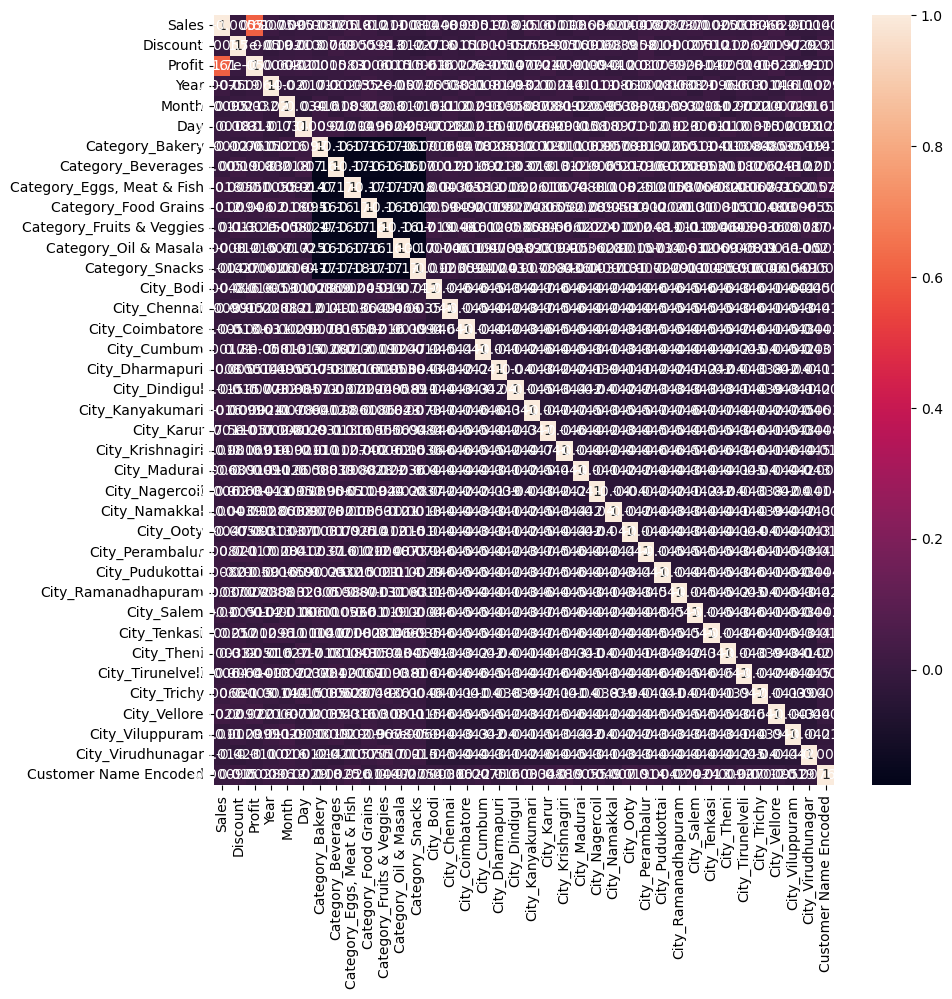

In [244]:
plt.figure(figsize=(10,10))
sns.heatmap(df.corr(),annot = True)
plt.show()

## PCA

In [245]:
from sklearn.preprocessing import StandardScaler

df_scaled=pd.DataFrame(StandardScaler().fit_transform(df),columns=df.columns)

In [246]:
df_scaled.head(2)

,Sales,Discount,Profit,Year,Month,Day,Category_Bakery,Category_Beverages,"Category_Eggs, Meat & Fish",Category_Food Grains,...,City_Ramanadhapuram,City_Salem,City_Tenkasi,City_Theni,City_Tirunelveli,City_Trichy,City_Vellore,City_Viluppuram,City_Virudhunagar,Customer Name Encoded
0,-0.420058,-1.431246,0.109798,0.247234,0.971327,-0.85375,-0.405791,-0.403614,-0.418583,-0.403279,...,-0.209709,-0.212296,-0.212553,-0.200707,-0.216128,-0.19247,4.687719,-0.203389,-0.208406,-0.869435
1,-1.294471,-0.627304,-0.938381,0.247234,0.971327,-0.85375,-0.405791,2.477614,-0.418583,-0.403279,...,-0.209709,-0.212296,-0.212553,-0.200707,-0.216128,-0.19247,-0.213323,-0.203389,-0.208406,0.863428


In [247]:
pca = PCA()
pca.fit(df_scaled)
data_pca = pca.transform(df_scaled)

In [248]:
pf = pd.DataFrame(data = data_pca, columns = [f"PC{i+1}" for i in range(df_scaled.shape[1])])

In [249]:
pc = pd.DataFrame(pca.components_.round(2),index = [f"PC{i+1}" for i in range(df_scaled.shape[1])],columns=list(df_scaled.columns))
pc

,Sales,Discount,Profit,Year,Month,Day,Category_Bakery,Category_Beverages,"Category_Eggs, Meat & Fish",Category_Food Grains,...,City_Ramanadhapuram,City_Salem,City_Tenkasi,City_Theni,City_Tirunelveli,City_Trichy,City_Vellore,City_Viluppuram,City_Virudhunagar,Customer Name Encoded
PC1,0.70,-0.00,0.70,-0.00,-0.01,0.01,-0.01,-0.00,0.05,0.03,...,0.01,0.01,-0.02,-0.00,-0.01,0.02,0.05,-0.03,-0.03,-0.00
PC2,-0.03,0.12,-0.05,-0.04,0.01,-0.03,-0.14,0.15,0.72,-0.06,...,0.03,0.06,0.02,0.04,0.00,0.06,0.02,-0.10,-0.12,0.15
PC3,-0.01,0.07,-0.00,0.02,-0.15,0.17,-0.17,0.69,-0.23,0.14,...,0.08,-0.01,0.01,0.07,0.04,0.06,0.03,0.10,-0.12,-0.06
PC4,0.01,-0.19,-0.01,-0.00,-0.08,-0.07,-0.09,-0.27,0.14,-0.17,...,0.01,0.12,-0.01,0.00,-0.05,-0.08,0.03,-0.01,0.05,-0.02
PC5,-0.01,-0.02,-0.02,0.01,0.14,0.04,0.46,-0.25,-0.08,0.61,...,0.06,0.03,0.02,0.02,-0.14,-0.03,0.00,0.08,-0.03,-0.12
PC6,0.01,-0.02,0.01,-0.09,-0.02,-0.01,0.66,0.23,-0.15,-0.55,...,0.03,0.14,-0.00,-0.11,-0.01,-0.06,-0.00,-0.01,-0.16,-0.03
PC7,0.02,0.01,-0.01,0.02,-0.07,-0.10,-0.27,0.10,-0.32,0.18,...,-0.07,0.00,-0.06,0.04,-0.04,-0.03,0.02,0.04,-0.01,-0.02
PC8,-0.02,0.02,-0.02,-0.16,-0.40,0.44,0.07,-0.17,0.02,-0.05,...,0.24,0.03,-0.27,0.39,-0.08,0.19,-0.17,-0.32,-0.01,-0.18
PC9,0.01,-0.32,-0.01,0.41,-0.25,-0.14,0.02,0.07,0.09,0.03,...,0.16,-0.15,-0.04,-0.09,-0.00,-0.06,-0.15,-0.02,-0.00,-0.15
PC10,-0.01,-0.19,0.01,-0.22,0.24,-0.03,-0.06,0.09,0.11,-0.07,...,0.20,0.12,-0.21,-0.06,-0.08,-0.11,0.09,0.24,0.26,-0.38


In [250]:
print("Principal Component Summary:\n")
print(pd.DataFrame({
    "Standard deviation": pca.explained_variance_.round(2),
    "Proportion of Variance": pca.explained_variance_ratio_.round(2),
    "Cumulative variance Ratio": pca.explained_variance_ratio_.cumsum().round(2)
}, index=[f"PC{i+1}" for i in range(df_scaled.shape[1])]))

Principal Component Summary:

      Standard deviation  Proportion of Variance  Cumulative variance Ratio
PC1                 1.61                    0.04                       0.04
PC2                 1.20                    0.03                       0.07
PC3                 1.20                    0.03                       0.11
PC4                 1.20                    0.03                       0.14
PC5                 1.18                    0.03                       0.17
PC6                 1.18                    0.03                       0.20
PC7                 1.18                    0.03                       0.23
PC8                 1.10                    0.03                       0.26
PC9                 1.09                    0.03                       0.29
PC10                1.08                    0.03                       0.32
PC11                1.07                    0.03                       0.34
PC12                1.06                    0.03          

In [251]:
pca.explained_variance_ratio_

array([4.24763473e-02, 3.16206975e-02, 3.14906866e-02, 3.14642948e-02,
       3.11678431e-02, 3.10585383e-02, 3.09558188e-02, 2.88279042e-02,
       2.86498526e-02, 2.83641022e-02, 2.80375573e-02, 2.79133528e-02,
       2.75257840e-02, 2.75231026e-02, 2.75158992e-02, 2.75003782e-02,
       2.74871737e-02, 2.74759977e-02, 2.74597586e-02, 2.74321823e-02,
       2.74182208e-02, 2.74132745e-02, 2.73775849e-02, 2.73376685e-02,
       2.72914752e-02, 2.72034995e-02, 2.71960788e-02, 2.71107871e-02,
       2.69453874e-02, 2.67615733e-02, 2.58155310e-02, 2.54521501e-02,
       2.53116240e-02, 2.50802710e-02, 2.40007747e-02, 1.03368275e-02,
       8.39283586e-33, 1.74468012e-33])

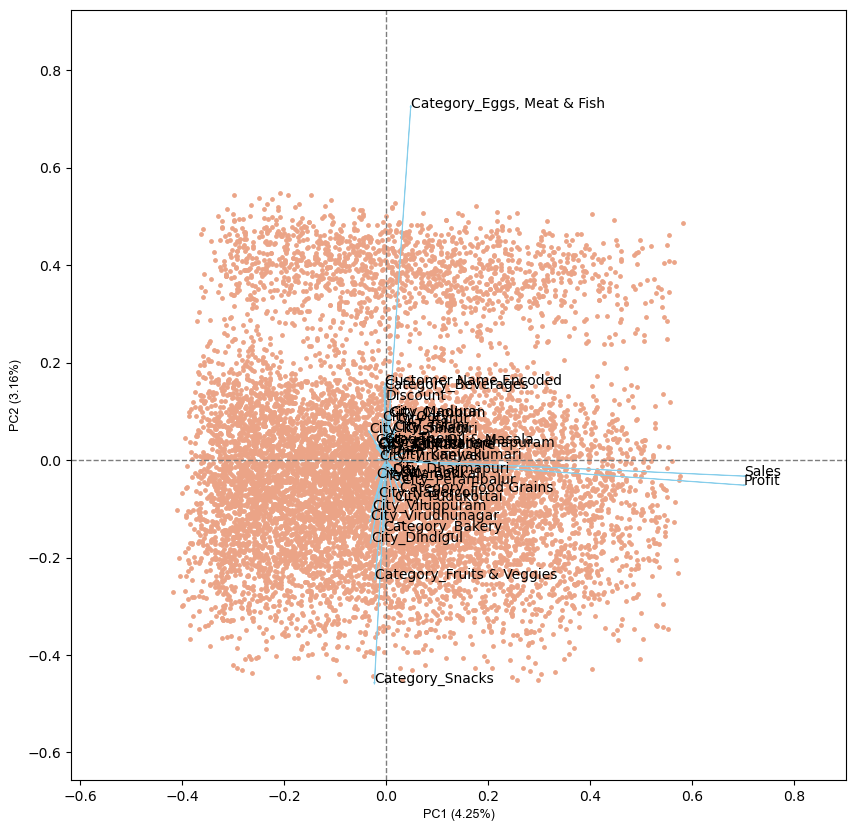

In [252]:
pca = PCA(n_components=0.8)
data_pca = pca.fit_transform(df_scaled)

cluster.biplot(cscore=data_pca, loadings=pca.components_, labels=df_scaled.columns.values, var1=round(pca.explained_variance_ratio_[0]*100, 2),
    var2=round(pca.explained_variance_ratio_[1]*100, 2), show=True, dim=(10,10))




## Inference

* Thus the plot shows that the Category_snaks , Region centre , Category_beverage in which Health drinks has the highest importance and high variance.

In [253]:
cumlative_variance= pca.explained_variance_ratio_.cumsum()

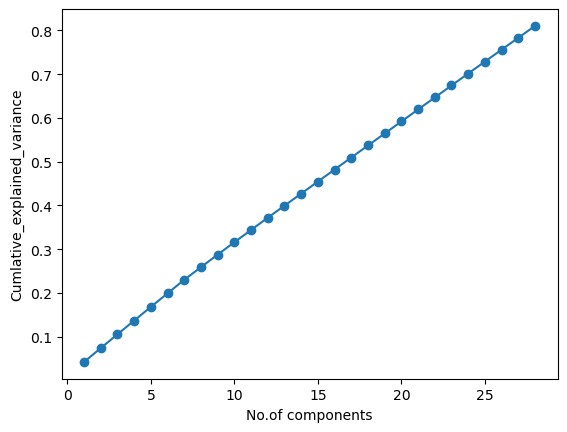

In [254]:
plt.plot(range(1,len(cumlative_variance) +1),cumlative_variance,marker='o',linestyle='-')
plt.xlabel('No.of components')
plt.ylabel('Cumlative_explained_variance')
plt.show()

* In Principal Component Analysis (PCA), loadings represent the weights or coefficients associated with 
* Each original feature in a particular principal component (PC). 
* They essentially tell how much each original feature contributes to the formation of that specific PC.

In [255]:
## doing PCA again to check the no. of componenets
cov_mat = np.cov(df_scaled.T)

In [256]:
eig_val,eig_vec = np.linalg.eig(cov_mat)

In [257]:
eig_val = list(eig_val)
eig_val

[0.39283875220716213,
 1.6142627200500779,
 6.776093176699308e-17,
 -5.190632064266141e-16,
 0.9121207038388265,
 1.2017067467335716,
 1.1967658408734057,
 1.1957628508923175,
 1.184496560262643,
 1.180342561042929,
 1.1764388284391403,
 0.9531456691564567,
 0.9619379635698261,
 0.9672784903427495,
 0.9810883444493397,
 1.095569980704498,
 1.088803345905164,
 1.0779437408455714,
 1.0170415523120715,
 1.0655337932624,
 1.0608135503542633,
 1.0240271836310322,
 1.0303130029588616,
 1.0335544102889638,
 1.0338364258713273,
 1.0371798360093618,
 1.038935358654469,
 1.040452333532782,
 1.0418086752597167,
 1.041996654184532,
 1.0425272435031159,
 1.0460844641531652,
 1.0459825598657109,
 1.0457088037894726,
 1.045118947304932,
 1.0435752466090136,
 1.0446171252657563,
 1.0441923957386883]

In [258]:
percentage = []

for i in eig_val:
    per = (i/np.sum(eig_val))*100
    percentage.append(per)

In [259]:
cum_sum = np.cumsum(percentage)
cum_sum

array([  1.03368275,   5.28131748,   5.28131748,   5.28131748,
         7.68139494,  10.84346469,  13.99253336,  17.13896284,
        20.25574715,  23.36160098,  26.45718286,  28.96520996,
        31.49637236,  34.04158737,  36.62314047,  39.50593088,
        42.37091615,  45.20732636,  47.8834837 ,  50.68723942,
        53.4785747 ,  56.17311344,  58.88419215,  61.60380002,
        64.32414997,  67.05329748,  69.78706433,  72.52482282,
        75.26615027,  78.00797236,  80.75119059,  83.50376899,
        86.25607925,  89.00766917,  91.757707  ,  94.50368286,
        97.25240023, 100.        ])

In [260]:
len(cum_sum[cum_sum<80])

30

In [261]:
# We choose 30 components
pca = PCA(n_components=30)

# Fit the data with selected number of components
pca.fit(df_scaled)

# Transforming the data to the principal component space 
scores_pca = pca.transform(df_scaled)

In [262]:
df_pc=pd.DataFrame(scores_pca)
component_names = [f'PC{i+1}' for i in range(30)]
df_pc.columns = component_names
df_pc

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30
0,-0.027576,-0.061731,-0.641563,1.599275,0.030612,0.500862,2.205567,-1.351762,-0.548789,1.169088,...,-0.980757,-1.314801,-1.269160,0.425283,0.005871,0.240506,0.922293,0.203557,-0.160777,0.117686
1,-1.759265,0.871505,1.219278,-0.581791,-0.270672,0.641203,0.074161,-2.064473,0.240263,-1.206536,...,0.823271,0.184705,0.440968,0.067213,-0.629761,-0.155054,0.746864,-0.981232,1.715327,0.001771
2,0.661324,-0.568229,0.873181,-0.714087,1.282457,-1.163060,0.381723,-0.066027,-0.844938,-1.203720,...,-0.115319,-0.090239,-1.507014,0.421714,0.135734,-0.949628,-2.041216,1.856527,-1.235120,-0.690342
3,-1.577105,-0.747811,-1.669144,-1.529589,-0.544863,-0.324766,0.461760,0.385136,-0.441285,1.053829,...,-1.156921,2.195131,-1.153047,0.569234,2.705334,-1.157193,-0.011519,-1.089868,2.076026,0.671528
4,2.654703,0.203765,0.568201,-0.636281,2.068279,-1.642968,0.769638,-0.448383,-1.031377,-0.662201,...,-0.590518,0.626447,1.161203,-1.301980,1.312467,-0.263671,-0.073916,-0.620005,-0.836580,0.962844
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9989,-0.535584,2.590852,-0.044795,0.753199,-0.126374,-0.329451,-0.897309,0.199602,1.254056,0.467927,...,-1.808454,0.264239,-0.451336,0.539396,-0.094736,0.708294,-1.122701,-0.820266,-1.367917,2.227887
9990,-1.169721,-0.428147,-0.877696,0.654135,1.333486,2.118493,-0.361292,0.843843,0.335873,-0.254851,...,0.426234,-0.791064,0.024494,1.040451,-0.303273,1.356220,-1.732727,0.075278,1.669062,0.995324
9991,0.649450,-0.455458,0.015068,-0.740246,1.538982,-1.674765,0.827230,0.114228,1.560693,0.224647,...,0.379232,-0.692718,-0.912226,-0.342714,1.233316,-0.395859,0.230571,1.051972,-0.545526,-1.107987
9992,0.856195,-0.545251,-0.818555,1.335040,-0.306455,0.490906,2.730235,-0.382442,0.441259,-0.229387,...,1.219271,-1.118207,-0.428551,0.435754,1.225259,0.245336,-1.375455,-0.155447,-0.070522,-0.928314


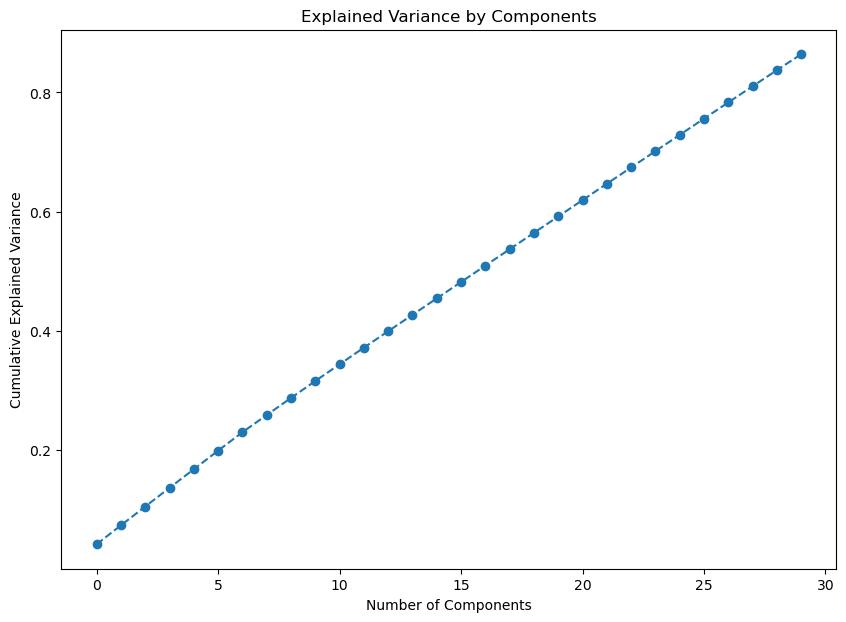

In [264]:
plt.figure(figsize=(10,7))
plt.plot(range(0,30), pca.explained_variance_ratio_.cumsum(), marker='o', linestyle='--')
plt.title('Explained Variance by Components')
plt.xlabel("Number of Components")
plt.ylabel('Cumulative Explained Variance')
plt.show()

## Inference

The graph shows the amount of variance captured (on the y-axis) depending on the number of components we include (the x-axis). 
A rule of thumb is to preserve around 80 % of the variance. So, in this instance, we decide to keep 6 components.

## K means

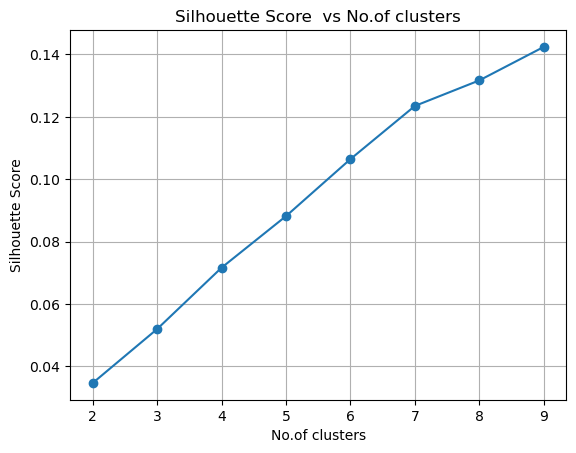

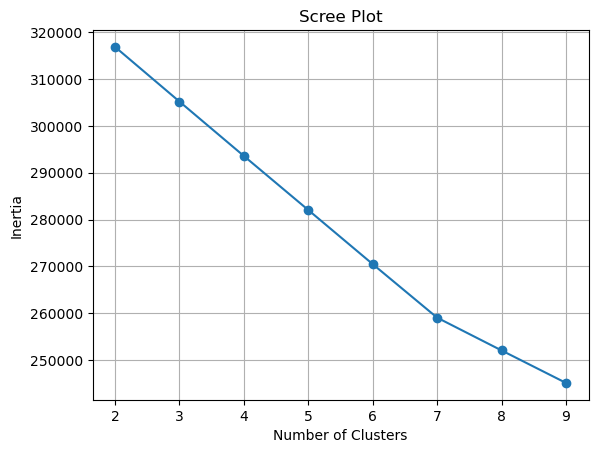

In [265]:
silhouette_scores = []

inertia_values = []

for i in range(2,10):
    km= KMeans(n_clusters = i , random_state=10)
    km.fit(df_pc)
    
    silhouette_avg = silhouette_score(df_pc, km.labels_)
    silhouette_scores.append(silhouette_avg)
    
    inertia_values.append(km.inertia_)
    
plt.plot(range(2,10) , silhouette_scores ,marker='o')
plt.xlabel('No.of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score  vs No.of clusters')
plt.xticks(range(2,10))
plt.grid(True)
plt.show()

# Plot the scree plot
plt.plot(range(2,10), inertia_values, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Scree Plot')
plt.xticks(range(2,10))
plt.grid(True)
plt.show()
    

In [266]:
## K means

In [267]:
from sklearn.cluster import KMeans

In [274]:
wcss=[]

for i in range(2,10):
    km= KMeans(n_clusters = i , random_state=10)
    km.fit(df_pc)
    wcss.append(km.inertia_)

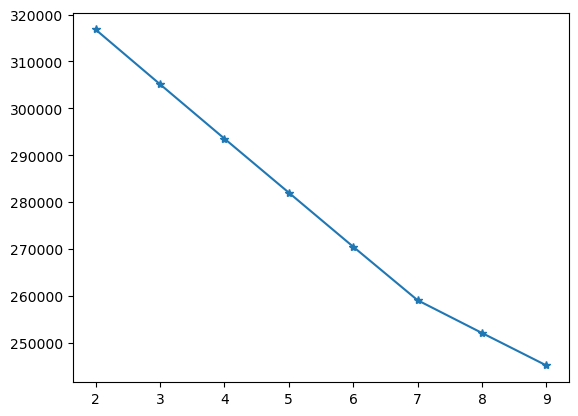

In [275]:
plt.plot(range(2,10),wcss,marker='*')
plt.show()

In [276]:
for i in range(2,10):
    km=KMeans(n_clusters= i , random_state=10)
    k_pred= km.fit_predict(df_pc)
    score= silhouette_score(df_pc,k_pred,random_state=10)
    print('silhouette_score',i,'is',score)

silhouette_score 2 is 0.03471531945615989
silhouette_score 3 is 0.05201337222650573
silhouette_score 4 is 0.07167950017073978
silhouette_score 5 is 0.08820186881327576
silhouette_score 6 is 0.10647178497396943
silhouette_score 7 is 0.12350392496741419
silhouette_score 8 is 0.1316954225217658
silhouette_score 9 is 0.14242422015107037


## Inference

* Based on the analysis of the provided graphs, it appears that there are seven clusters with favorable inertia offset, indicating well-defined clusters.
* The scree plot reveals an upward trend in variance explained after the forth cluster, suggesting that the optimal choice for this dataset may extend beyond three clusters.
* The silhouette_score shows k=7 , a higher silhouette score indicates better-defined clusters because of the wide area, whereas the avg silhouette_coefficient is about 0.5 , thus the clusters are not overlaped.

Cluster Centers:
[[-9.39617713e-02 -7.15146445e-01 -1.24827883e+00 -1.57897279e+00
  -1.16463534e+00 -4.03959489e-01  1.86439303e-01  2.69619337e-01
  -1.18077177e-01  1.73919359e-01 -3.15880406e-02 -1.12329123e-01
  -2.85428072e-02  3.33545460e-02  7.72110110e-03  1.23065772e-02
  -3.60693608e-02 -5.45790188e-02 -7.85838978e-02  3.27175223e-02
   1.29914091e-01 -4.65321290e-03 -5.46389927e-02  1.75266802e-01
  -9.61084144e-02 -1.15793356e-01  5.35161692e-02 -2.23380004e-01
   7.57367510e-02  7.91757480e-01  8.00000000e+00]
 [-9.38762298e-02  4.97327377e-03 -4.82581092e-01  9.05547895e-01
  -2.89170055e-01  5.12653415e-01  1.69026237e+00  1.01299547e-01
  -1.86156434e-01 -2.25538475e-01 -2.98065116e-01  4.68206479e-03
   2.15023409e-02 -2.76991976e-02  1.16190554e-02  5.62485716e-03
   3.42468431e-02  7.50538794e-02  1.79708087e-02 -1.04595809e-01
  -3.98679575e-01 -7.60364805e-02  3.45576701e-01 -3.85626590e-01
  -1.03038046e-01 -1.42153149e-01  2.59289331e-01  3.58417987e-02
  -3.262

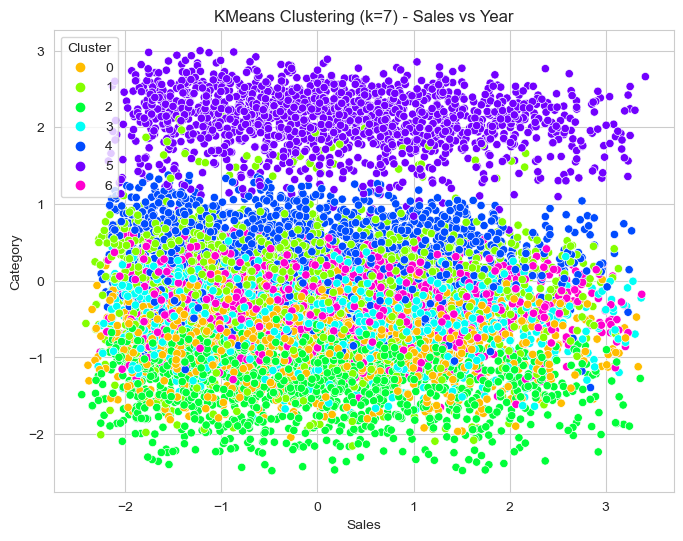

In [278]:
# Initialize KMeans model
kmeans = KMeans(n_clusters= 7 , random_state=10)

# Fit the model to the data
kmeans.fit(df_pc)

# Get cluster labels
cluster_labels = kmeans.labels_

# Add cluster labels to the DataFrame
df_pc['k_cluster'] = cluster_labels

# Print cluster centers
print("Cluster Centers:")
print(kmeans.cluster_centers_)

sns.set_style("whitegrid")
palette = sns.color_palette("hsv", len(df_pc['k_cluster'].unique())) 

# Plot the clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_pc, x='PC1', y='PC2', hue='k_cluster', palette=palette, legend='full')

# Add labels and title
plt.xlabel('Sales')
plt.ylabel('Category')
plt.title(f"KMeans Clustering (k=7) - {'Sales'} vs {'Year'}")

# Show the plot
plt.legend(title='Cluster')
plt.show()

## Segement Profiling

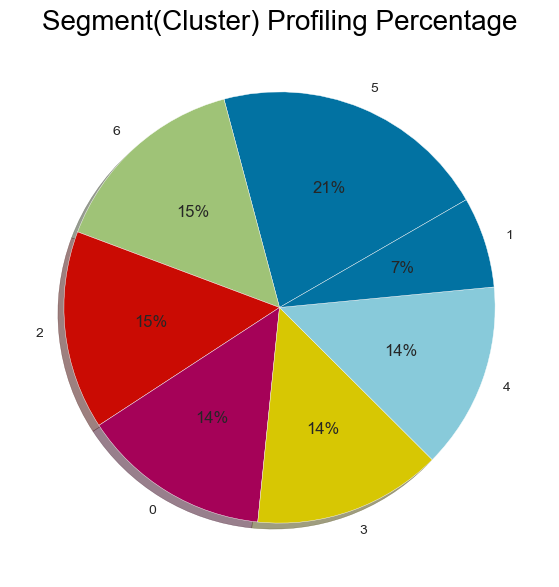

In [1089]:
plt.figure(figsize=(12,7))
plt.pie(df_pc['k_cluster'].value_counts(), labels= df_pc['k_cluster'].value_counts().index, 
         autopct='%.0f%%',  shadow = True, startangle=30)
plt.title('Segment(Cluster) Profiling Percentage',fontsize=20, color = 'Black')
plt.show()

* Segment 5 has around 24 % of clustered features,followed by 6 , 2 is of 15 %  which contributing the profiling.

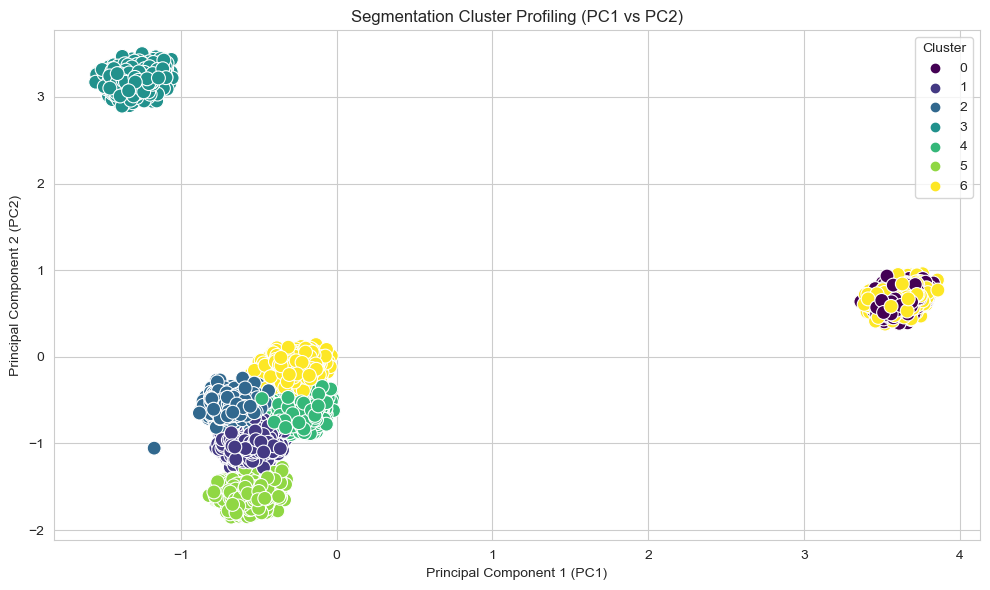

In [85]:
sns.set_style('whitegrid')

# Create a scatter plot for PC1 vs PC2 colored by cluster labels
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', data=df_pc, hue='k_cluster', palette='viridis', s=100)
plt.title('Segmentation Cluster Profiling (PC1 vs PC2)')
plt.xlabel('Principal Component 1 (PC1)')
plt.ylabel('Principal Component 2 (PC2)')
plt.legend(title='Cluster')
plt.tight_layout()
plt.show()

In [106]:
df_pc['k_cluster'].value_counts(normalize=True)

k_cluster
6    0.213828
3    0.151491
5    0.149089
1    0.141385
4    0.139884
2    0.136182
0    0.068141
Name: proportion, dtype: float64

In [87]:
df_pc.head(2)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,k_cluster
0,-1.171784,-1.054121,-1.306333,5.731500,-3.044612,-0.525701,0.740269,0.938351,2.320486,-0.082953,...,12.423319,7.950706,15.085999,2.960495,-1.112178,5.884300,0.928589,2.480591,16.538788,2
1,3.497514,0.645771,-0.082189,-0.134461,-0.390828,-0.198294,-1.694053,-0.382217,-0.513966,2.452119,...,0.641877,0.608304,-0.837611,-0.208217,1.108032,1.265243,0.343861,-0.786596,-0.255186,6


## Conclusion

The analysis of the retail smart store data reveals several key insights:

* Top Buyer and Product Categories:

Amrish emerges as the top buyer over the four-year period.
Snacks and Eggs, Meat & Fish are the top-selling product categories.
Health Drinks and Soft Drinks lead as the top-selling sub-categories.

* Order Trends and District Contributions:

Kanyakumari and Tirunelveli districts show higher order volumes.
West Tamil Nadu stands out as the top-buying region, contributing significantly to the smart store's turnover.

* Regional Product Preferences:

Oil & Masala and Snacks dominate sales in Kanyakumari, while Beverages and Snacks lead in Tirunelveli.
Trichy sees lower sales of Oil & Masala products.

* Sales Trends:

Chicken, Fish, Noodles, and Spices show increasing sales across Tamil Nadu.
Sales remain consistent from March to August due to lower food consumption during summer.
Biscuits, Organic Vegetables, Dal, and Pulses witness increased sales from 2015 to 2018.

* Customer Insights:

Amy from Pudukkottai emerges as the top buyer of Masalas in 2018.
Harish from Ramanadhapuram consistently purchases Health Drinks.
Kartick from Cumbum is the top buyer of Atta and Flour.
Karur sees high sales of Fresh Vegetables in 2018.

* Seasonal and Yearly Sales Variations:

Sales generally increase but decrease in December each year.
These insights can guide strategic decisions regarding product offerings, marketing strategies, inventory management, and customer engagement to optimize sales and customer satisfaction in the retail smart store.





